In [2]:
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import wordcloud
import warnings
warnings.filterwarnings('ignore')
pd.set_option('max_colwidth', 99)

%matplotlib inline

In [4]:
df = pd.read_csv('nosleep.csv')

In [5]:
df

,text,nosleep
0,"She Sold Happiness in Glass Jars The poster read, “Happiness! Sold in Glass Jars! Call Today!” ...",1
1,"A Shattered Life I don't know when you're going to read this, but I can tell you when it starte...",1
2,"My sugar daddy asks me for weird favors His Tinder profile said he was 45, but he looked to be ...",1
3,Something happened 63 years ago that's haunted me my entire life. I’ve never told anyone about ...,1
4,My job is watching a woman trapped in a room. Three years ago I was looking at the local job cl...,1
...,...,...
1991,"Stéphane Parent has been arrested in connection with Adrienne McColl's death, exactly 16 years ...",0
1992,"(Solved) Rachel N. Owens Found Alive, Voluntarily Missing Over 5 Years I'm surprised this case ...",0
1993,Disappeared season 5 updated list Disappeared - Investigation Discovery / 2012\n\nThis is the u...,0
1994,What are the things you immediately write-off when considering a suspect or theory? [Other] My ...,0


In [6]:
X = df['text']
y = df['nosleep']

df['text'][1]

'A Shattered Life I don\'t know when you\'re going to read this, but I can tell you when it started: I was out for a walk alone in the woods when the entity came for me. It was beyond a blur. It was, for lack of a better term, absence of meaning. Where it hid, there were no trees; where it crept closer, there was no grass; through the arc it leapt at me, there was no breeze of motion. There was no air at all.\n\nAs it struck, I felt the distinct sensation of claws puncturing me somewhere unseen; somewhere I\'d never felt before. My hands and arms and legs and torso seemed fine and I wasn\'t bleeding, but I knew I\'d been injured somehow. As I fearfully ran back home, I could tell that I was less. I was vaguely tired, and it was hard to focus at times.\n\nThe solution at that early stage was easy: a big cup of coffee helped me feel normal again.\n\nFor a while, that subtle drain on my spirit became lost in the ebb and flow of caffeine in my system. You could say my life began that week,

In [7]:
nosleep_text = df.loc[df['nosleep']== 1, 'text'].str.cat()

In [8]:
nosleep_text

'She Sold Happiness in Glass Jars The poster read, “Happiness! Sold in Glass Jars! Call Today!” and underneath the text was a phone number.\n\nI was walking home from a long, exhausting day of work when I caught a glimpse of the paper stapled on an old telephone pole. I took a picture of it thinking it was amusing.\n\nI was going to show my wife once I got to our apartment, but I was caught up with chores and forgot about it—dinner, dishes, laundry, packing a snack for our daughter, putting her to bed, then putting her toys away that she’d left out in the living room—every night, it was the exact same routine.\n\nThe next day, I awoke sleeping back-to-back with my wife. I always had to get up earlier than she did for my job, so I quietly got ready for the day and headed out the door.\n\nAt work, I was updating the company’s latest expense report. Most days were similar to this one. They were basically paying me to stare at a computer for nine hours a day and input a couple numbers in t

In [37]:
def wordclouder(reddit):
    
    wc = wordcloud.WordCloud(width=800, height=500, margin=1, background_color='black', colormap='Purples')




    word_text = df.loc[df['nosleep']==reddit, 'text'].str.cat()

    cloud = wc.generate_from_text(word_text)

    return cloud.to_image()

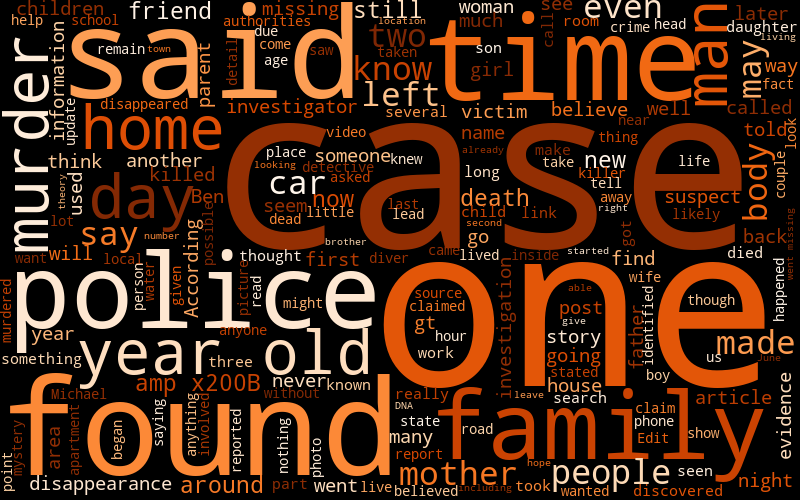

In [34]:
wordclouder(0)

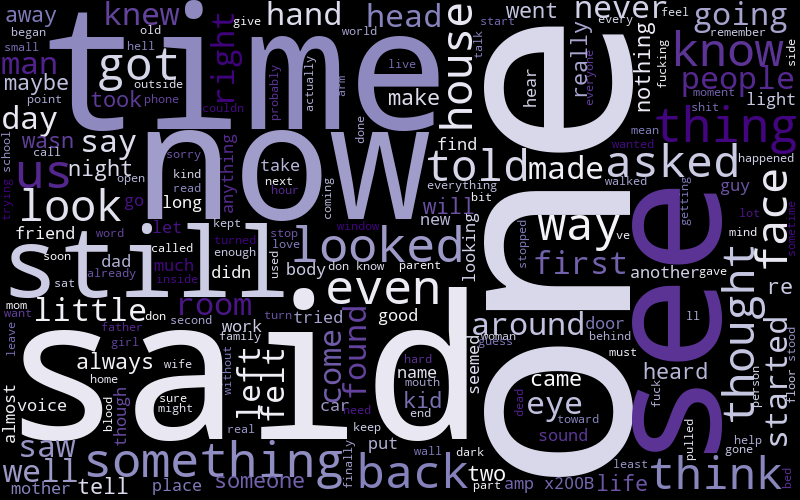

In [38]:
wordclouder(1)

In [12]:
custom_stop = list(ENGLISH_STOP_WORDS)

cv = CountVectorizer(stop_words=custom_stop, min_df=6)

df_features = pd.DataFrame(cv.fit_transform(X).todense(), columns=cv.get_feature_names())

In [13]:
nosleep_df= df_features[df['nosleep'] == 1]
unresolved_df= df_features[df['nosleep'] == 0]

In [14]:
df_features.sum().sort_values(ascending=False).head(20)

just      9579
like      9393
said      8275
time      6744
know      6429
didn      6211
don       5343
did       4593
going     3926
got       3894
think     3610
door      3607
man       3564
room      3529
looked    3490
day       3361
ve        3353
way       3330
people    3292
eyes      3260
dtype: int64

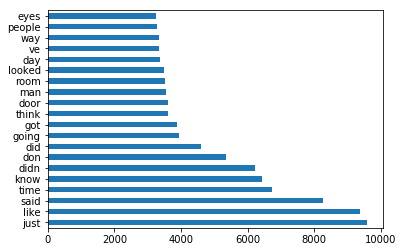

In [15]:
df_features.sum().sort_values(ascending=False).head(20).plot.barh()

In [16]:
words = df_features.sum().sort_values(ascending=False).head(20).index

In [17]:
nosleep_df.loc[:, words].sum()

just      8549
like      8568
said      6727
time      5264
know      5634
didn      5587
don       4916
did       3531
going     3496
got       3446
think     3024
door      3336
man       2611
room      3125
looked    3328
day       2481
ve        2990
way       2844
people    2385
eyes      3160
dtype: int64

In [18]:
unresolved_df.loc[:, words].sum()

just      1030
like       825
said      1548
time      1480
know       795
didn       624
don        427
did       1062
going      430
got        448
think      586
door       271
man        953
room       404
looked     162
day        880
ve         363
way        486
people     907
eyes       100
dtype: int64

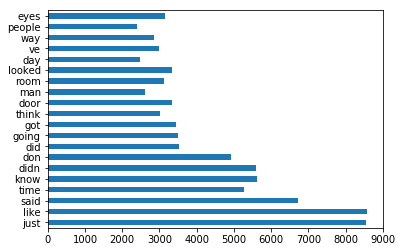

In [19]:
nosleep_df.loc[:, words].sum().plot.barh()

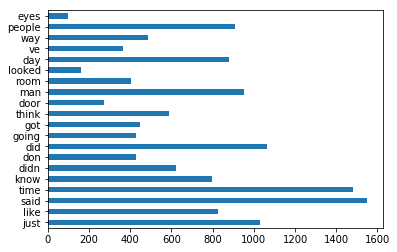

In [20]:
unresolved_df.loc[:, words].sum().plot.barh()

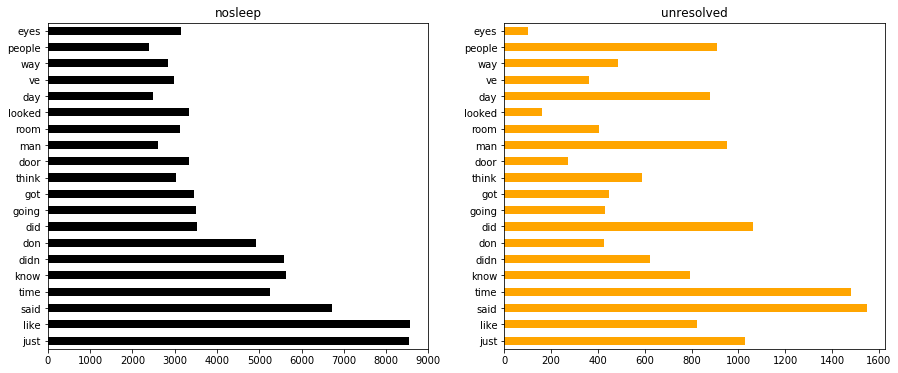

In [23]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 6))

nosleep_df.loc[:,words].sum().plot.barh(ax=ax1, title='nosleep', color='black')
unresolved_df.loc[:, words].sum().plot.barh(ax=ax2, title='unresolved', color='orange')

In [ ]:
feat_importance = pd.DataFrame(np.transpose(.coef_), train_df.columns, columns=['is_news'])